# Pytorch Workflow


In [23]:
import torch
from torch import nn
import matplotlib.pyplot as plt

torch.__version__

'2.8.0+cu126'

In [24]:
what_were_covering = {1: "data (prepare and load)",
    2: "build model",
    3: "fitting the model to data (training)",
    4: "making predictions and evaluating a model (inference)",
    5: "saving and loading a model",
    6: "putting it all together"
}

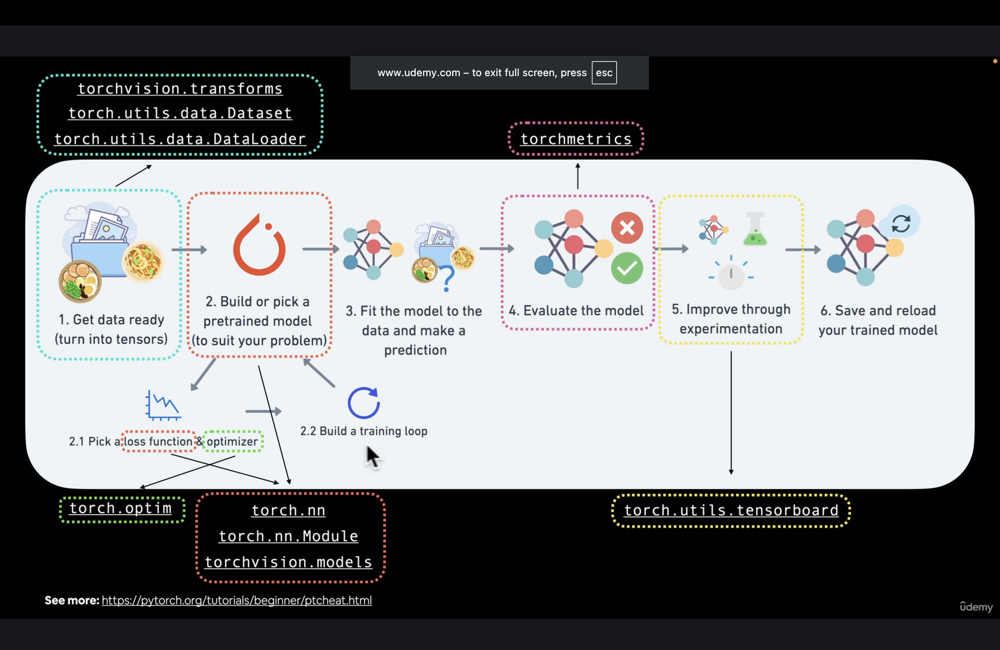

## Data Preparing and loading

Machine learning is a game of two parts:

- Turn your data, whatever it is, into numbers (a representation).
- Pick or build a model to learn the representation as best as possible.

In [25]:
X = torch.arange(0, 1, 0.02)
print(X.shape)   # torch.Size([50]) its a single array

torch.Size([50])


In [26]:
X = torch.arange(0, 1, 0.02).unsqueeze(1)
print(X.shape)   # torch.Size([50, 1]) now it has 50 rows of 1 feature

torch.Size([50, 1])


In [27]:
# create known parameters

weight = 0.7
bias = 0.3

# Create
start = 0
end = 1
step = 0.02
X = torch.arange(start,end,step).unsqueeze(dim=1)
y = weight * X + bias

X[:10], y[:10]

(tensor([[0.0000],
         [0.0200],
         [0.0400],
         [0.0600],
         [0.0800],
         [0.1000],
         [0.1200],
         [0.1400],
         [0.1600],
         [0.1800]]),
 tensor([[0.3000],
         [0.3140],
         [0.3280],
         [0.3420],
         [0.3560],
         [0.3700],
         [0.3840],
         [0.3980],
         [0.4120],
         [0.4260]]))

In [28]:
len(X) ,len(y)

(50, 50)

### Splitting data into training and testing

- Training
- Validation (practice)
- Testing

In [29]:
# Create a train/test split

train_split = int(0.8*len(X))
X_train, y_train = X[:train_split], y[:train_split]
X_test, y_test = X[train_split:], y[train_split:]

len(X_train), len(y_train), len(X_test), len(y_test)

(40, 40, 10, 10)

### Visualize the data

In [30]:
def plot_predictions(train_data=X_train,
                     train_labels=y_train,
                     test_data=X_test,
                     test_labels=y_test,
                     predictions=None):
  """
  Plots training data, test data and compares predictions.
  """
  plt.figure(figsize=(10, 7))

  # Plot training data in blue
  plt.scatter(train_data, train_labels, c="b", s=4, label="Training data")

  # Plot test data in green
  plt.scatter(test_data, test_labels, c="g", s=4, label="Testing data")

  if predictions is not None:
    # Plot the predictions in red (predictions were made on the test data)
    plt.scatter(test_data, predictions, c="r", s=4, label="Predictions")

  # Show the legend
  plt.legend(prop={"size": 14});

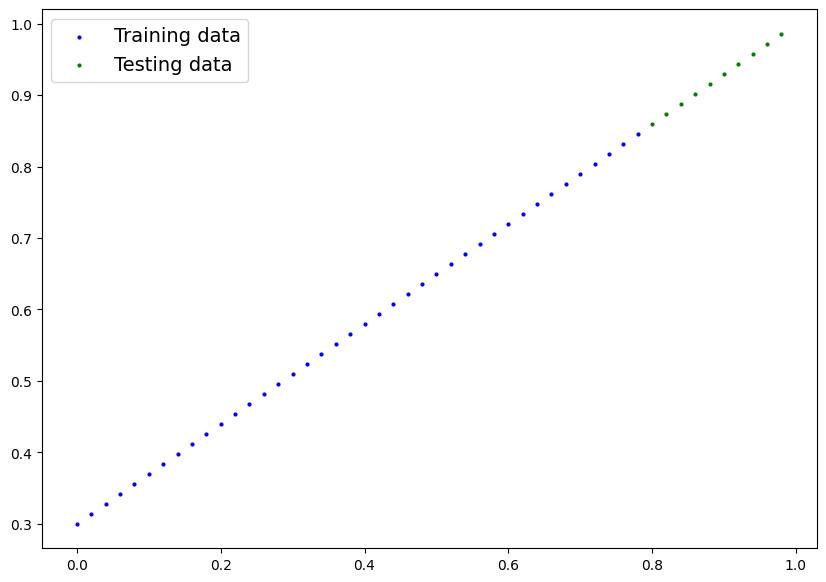

In [31]:
plot_predictions();

## Build the Model

- start with random values
- Look at the training data and adjust the random values to better represent the ideal values.

How?
- Gradient Descent (https://www.youtube.com/watch?v=IHZwWFHWa-w)
- Backpropagation (https://www.youtube.com/watch?v=Ilg3gGewQ5U)

In [32]:
class LinearRegressionModel (nn.Module): # subclass the nn module
  def __init__(self):
    super().__init__()
    self.weights = nn.Parameter(torch.rand(1,
                                           requires_grad = True,
                                           dtype = torch.float))
    self.bias = nn.Parameter(torch.rand(1,
                                           requires_grad = True,
                                           dtype = torch.float))
  def forward(self, x: torch.Tensor) -> torch.Tensor:
    return self.weights * x + self.bias

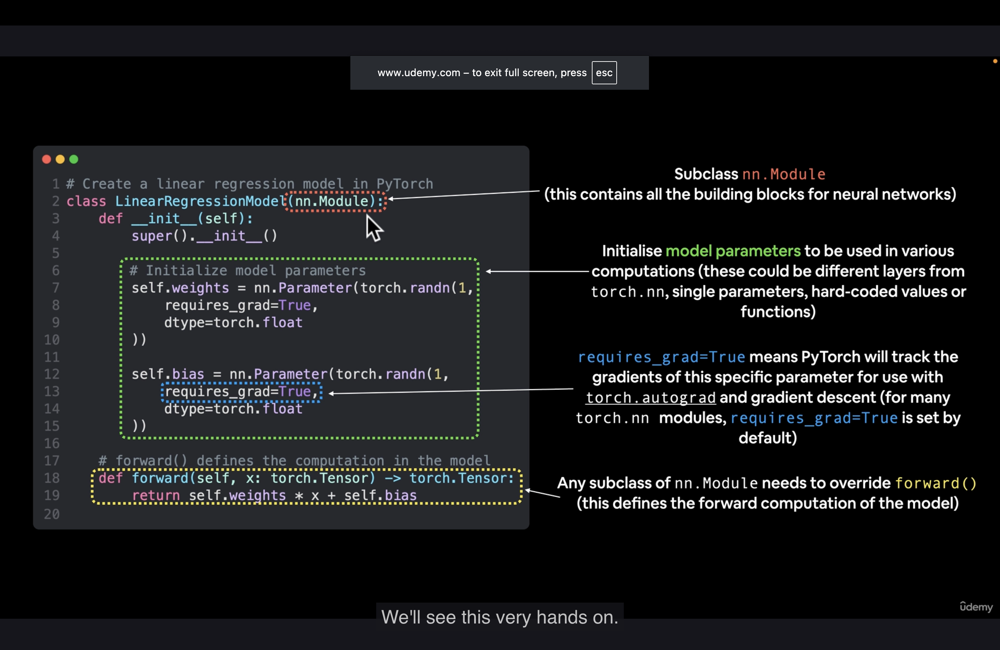

### Building essentials
* torch.nn - contains all of the buildings for computational graphs (a neural network can be considered a computational graph)

* torch.nn. Parameter - what parameters should our model try and learn, often a PyTorch layer from torch.nn will set these for us

* torch.nn.Module - The base class for all neural network modules, if you subclass it, you should overwrite forward()

* torch.optim - this where the optimizers in PyTorch live, they will help with gradient descent

* def forward() - All nn.Module
subclasses require u to overwrite forward(), this method defines what happens in the forward computation

In [33]:
# Whats inside our model?

torch.manual_seed(42)
model_0 = LinearRegressionModel()
list(model_0.parameters())

[Parameter containing:
 tensor([0.8823], requires_grad=True),
 Parameter containing:
 tensor([0.9150], requires_grad=True)]

In [34]:
# List named parameters
model_0.state_dict()

OrderedDict([('weights', tensor([0.8823])), ('bias', tensor([0.9150]))])

In [35]:
weight, bias # get the random values to close to this (ideal values)

(0.7, 0.3)

In [36]:
y_preds = model_0(X_test)

y_preds

tensor([[1.6208],
        [1.6385],
        [1.6561],
        [1.6738],
        [1.6914],
        [1.7090],
        [1.7267],
        [1.7443],
        [1.7620],
        [1.7796]], grad_fn=<AddBackward0>)

In [37]:
with torch.inference_mode(): # turns off the gradient tracking
  y_preds = model_0(X_test)

y_preds

tensor([[1.6208],
        [1.6385],
        [1.6561],
        [1.6738],
        [1.6914],
        [1.7090],
        [1.7267],
        [1.7443],
        [1.7620],
        [1.7796]])

In [38]:
with torch.no_grad():  # This also works but inference mode is prefered
    y_preds = model_0(X_test)

y_preds

tensor([[1.6208],
        [1.6385],
        [1.6561],
        [1.6738],
        [1.6914],
        [1.7090],
        [1.7267],
        [1.7443],
        [1.7620],
        [1.7796]])

In [39]:
y_test

tensor([[0.8600],
        [0.8740],
        [0.8880],
        [0.9020],
        [0.9160],
        [0.9300],
        [0.9440],
        [0.9580],
        [0.9720],
        [0.9860]])

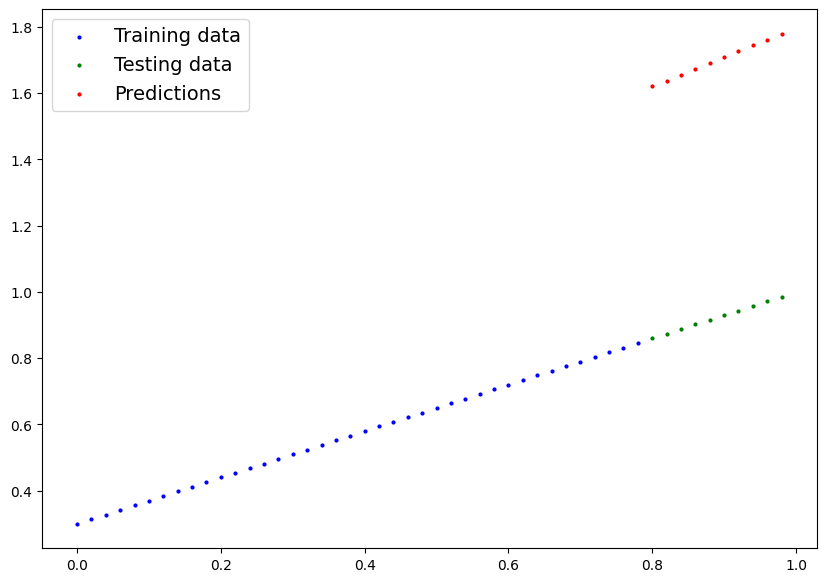

In [40]:
plot_predictions(predictions=y_preds)

## Train the Model

- Using Loss function (to measure how wrong the mode predictions are from the ideal values)
- Need an Optimizer (Adjusts the model's weights and bias according to the losses)

For pytorch we need:
- training loop
- testing loop

### L1 Loss (MAE)


In [41]:
model_0.state_dict()

OrderedDict([('weights', tensor([0.8823])), ('bias', tensor([0.9150]))])

In [42]:
weight, bias

(0.7, 0.3)

In [43]:
# Setup a loss function
loss_fn = nn.L1Loss()
loss_fn

L1Loss()

In [44]:
# Setup an optimier
optimizer = torch.optim.SGD(params = model_0.parameters(), # we want to optimize the parameters in our model
                            lr = 0.01) # lr = learning rater = possibly the most important hyperparameter
                            # more the lr more the change in the values

### Building a training loop and a testing loop

Needs in a training loop:
0. Loop thru the data
1. Forward pass/propagation
2. Calculate the loss
3. Optimize zero grad
4. Loss backward (backpropagation)
5. Optimizer step (gradient descent)

In [45]:
list(model_0.parameters())

[Parameter containing:
 tensor([0.8823], requires_grad=True),
 Parameter containing:
 tensor([0.9150], requires_grad=True)]

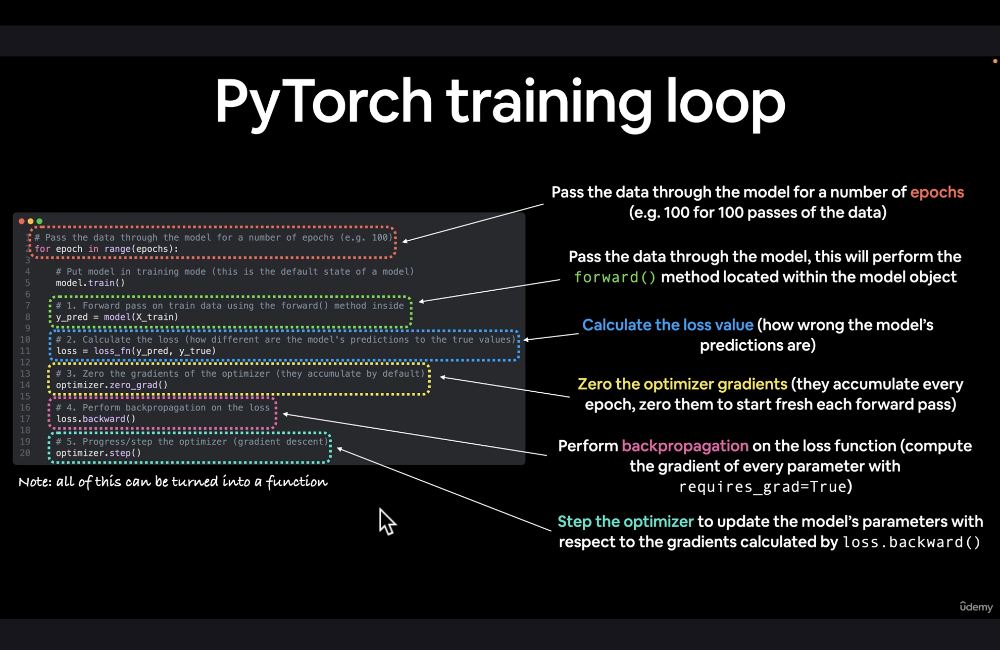

In [46]:
# epoch is one loop thru the data
epochs = 80

epoch_count=[]
train_loss_values = []
test_loss_values = []

for epoch in range(epochs):
  model_0.train() # train mode in pytorch sets all parameters that require gradients

  # 1. Forward pass
  y_pred = model_0(X_train)

  # 2. Calculate the loss
  loss = loss_fn(y_pred, y_train)

  # 3. optimizer zero grad
  optimizer.zero_grad() # makes grad 0 so we can start freash on each loop

  # 4. backpropagation
  loss.backward()

  # 5. optimizer step
  optimizer.step()

  # Testing
  model_0.eval() # turns off gradient tracking - turns off the different settings that is not needed for evaluation (dropout/batch norm layers)
  with torch.inference_mode():
    test_pred = model_0(X_test)
    test_loss = loss_fn(test_pred, y_test)

  if epoch % 10 == 0:
    epoch_count.append(epoch)
    train_loss_values.append(loss)
    test_loss_values.append(test_loss)
    print(f"Epoch: {epoch} | Test loss: {test_loss} | Loss: {test_loss}")
    print(model_0.state_dict())

Epoch: 0 | Test loss: 0.7637526988983154 | Loss: 0.7637526988983154
OrderedDict({'weights': tensor([0.8784]), 'bias': tensor([0.9050])})
Epoch: 10 | Test loss: 0.6290428042411804 | Loss: 0.6290428042411804
OrderedDict({'weights': tensor([0.8394]), 'bias': tensor([0.8050])})
Epoch: 20 | Test loss: 0.4943329691886902 | Loss: 0.4943329691886902
OrderedDict({'weights': tensor([0.8004]), 'bias': tensor([0.7050])})
Epoch: 30 | Test loss: 0.35962313413619995 | Loss: 0.35962313413619995
OrderedDict({'weights': tensor([0.7614]), 'bias': tensor([0.6050])})
Epoch: 40 | Test loss: 0.2249133139848709 | Loss: 0.2249133139848709
OrderedDict({'weights': tensor([0.7224]), 'bias': tensor([0.5050])})
Epoch: 50 | Test loss: 0.09020347893238068 | Loss: 0.09020347893238068
OrderedDict({'weights': tensor([0.6834]), 'bias': tensor([0.4050])})
Epoch: 60 | Test loss: 0.020998019725084305 | Loss: 0.020998019725084305
OrderedDict({'weights': tensor([0.6539]), 'bias': tensor([0.3200])})
Epoch: 70 | Test loss: 0.01

In [47]:
model_0.state_dict()

OrderedDict([('weights', tensor([0.6862])), ('bias', tensor([0.3060]))])

In [48]:
weight, bias

(0.7, 0.3)

In [49]:
with torch.inference_mode():
  y_preds_new = model_0(X_test)
y_preds_new

tensor([[0.8550],
        [0.8687],
        [0.8824],
        [0.8962],
        [0.9099],
        [0.9236],
        [0.9373],
        [0.9511],
        [0.9648],
        [0.9785]])

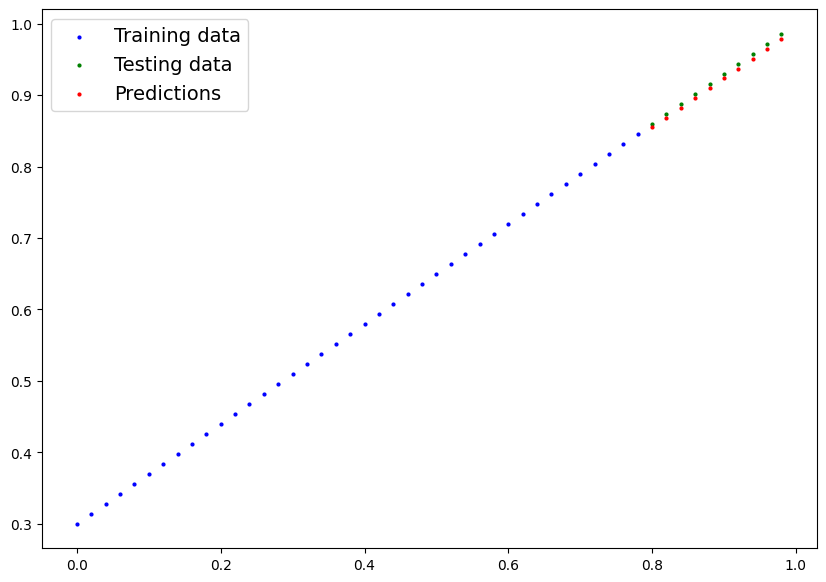

In [50]:
plot_predictions(predictions = y_preds_new)

### Plot the loss curves

In [51]:
test_loss_values, train_loss_values #they are as tensors

([tensor(0.7638),
  tensor(0.6290),
  tensor(0.4943),
  tensor(0.3596),
  tensor(0.2249),
  tensor(0.0902),
  tensor(0.0210),
  tensor(0.0141)],
 [tensor(0.6861, grad_fn=<MeanBackward0>),
  tensor(0.5709, grad_fn=<MeanBackward0>),
  tensor(0.4557, grad_fn=<MeanBackward0>),
  tensor(0.3405, grad_fn=<MeanBackward0>),
  tensor(0.2252, grad_fn=<MeanBackward0>),
  tensor(0.1100, grad_fn=<MeanBackward0>),
  tensor(0.0097, grad_fn=<MeanBackward0>),
  tensor(0.0062, grad_fn=<MeanBackward0>)])

In [52]:
import numpy as np
print(np.array(torch.tensor(test_loss_values).cpu().numpy())) # converting into numpy friendly
n_test_loss_values = np.array(torch.tensor(test_loss_values).cpu().numpy())
n_train_loss_values = np.array(torch.tensor(train_loss_values).cpu().numpy())

[0.7637527  0.6290428  0.49433297 0.35962313 0.22491331 0.09020348
 0.02099802 0.01409923]


/tmp/ipython-input-2898680929.py:4: UserWarning: Converting a tensor with requires_grad=True to a scalar may lead to unexpected behavior.
Consider using tensor.detach() first. (Triggered internally at /pytorch/torch/csrc/autograd/generated/python_variable_methods.cpp:835.)
  n_train_loss_values = np.array(torch.tensor(train_loss_values).cpu().numpy())


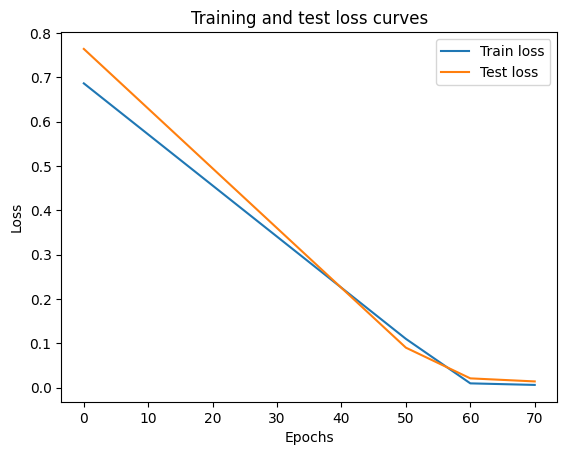

In [53]:
plt.plot(epoch_count, n_train_loss_values, label="Train loss")
plt.plot(epoch_count, n_test_loss_values, label="Test loss")
plt.title("Training and test loss curves")
plt.ylabel("Loss")
plt.xlabel("Epochs")
plt.legend();

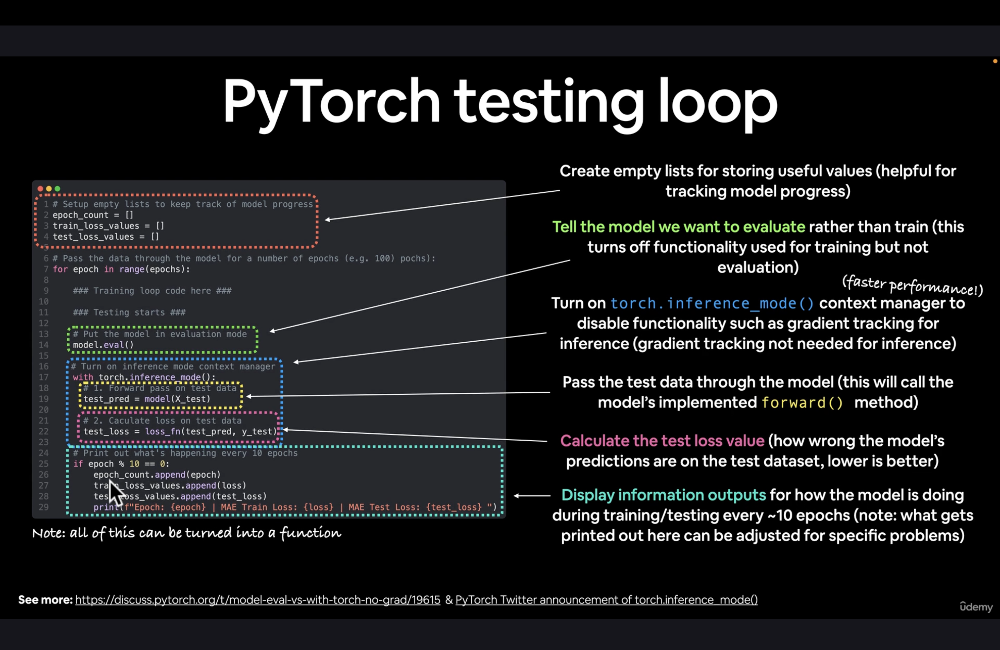

## Saving a **model**

- `torch.save()` : Saves a serialized object to disk using Python's pickle utility. Models, tensors and various other Python objects like dictionaries can be saved using torch.save.

- `torch.load() `:	Uses pickle's unpickling features to deserialize and load pickled Python object files (like models, tensors or dictionaries) into memory. You can also set which device to load the object to (CPU, GPU etc).

- `torch.nn.Module.load_state_dict() `: Loads a model's parameter dictionary (model.state_dict()) using a saved state_dict() object.

In [54]:
# Saving a model
from pathlib import Path

# 1. Create model directory
MODEL_PATH = Path("models")
MODEL_PATH.mkdir(parents=True, exist_ok=True)

MODEL_NAME = "01_pytorch_workflow.pth"
MODEL_SAVE_PATH = MODEL_PATH / MODEL_NAME

# 2. Save it
torch.save(obj=model_0.state_dict(), f=MODEL_SAVE_PATH)

### Load the model

In [55]:
!ls -l models

total 4
-rw-r--r-- 1 root root 1989 Aug 29 16:49 01_pytorch_workflow.pth


In [56]:
model_0.state_dict()

OrderedDict([('weights', tensor([0.6862])), ('bias', tensor([0.3060]))])

In [57]:
loaded_model_0 = LinearRegressionModel()

loaded_model_0.load_state_dict(torch.load(f=MODEL_SAVE_PATH))

<All keys matched successfully>

In [58]:
loaded_model_0.state_dict()

OrderedDict([('weights', tensor([0.6862])), ('bias', tensor([0.3060]))])

In [59]:
loaded_model_0.eval()

with torch.inference_mode():
  loaded_y_preds = loaded_model_0(X_test)

loaded_y_preds

tensor([[0.8550],
        [0.8687],
        [0.8824],
        [0.8962],
        [0.9099],
        [0.9236],
        [0.9373],
        [0.9511],
        [0.9648],
        [0.9785]])

In [60]:
model_0.eval()
with torch.inference_mode():
  y_pred = model_0(X_test)

y_pred

tensor([[0.8550],
        [0.8687],
        [0.8824],
        [0.8962],
        [0.9099],
        [0.9236],
        [0.9373],
        [0.9511],
        [0.9648],
        [0.9785]])

In [61]:
y_pred == loaded_y_preds

tensor([[True],
        [True],
        [True],
        [True],
        [True],
        [True],
        [True],
        [True],
        [True],
        [True]])

## Putting all together

### Importing libs

In [62]:
import torch
from torch import nn
import matplotlib.pyplot as plt
torch.__version__

'2.8.0+cu126'

In [63]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

### Data creation

In [64]:
weight = 0.7
bias = 0.3

start = 0
end = 1
step = 0.02

X = torch.arange(start,end,step).unsqueeze(dim=1)
y = weight * X + bias
X[:10], y[:10]

(tensor([[0.0000],
         [0.0200],
         [0.0400],
         [0.0600],
         [0.0800],
         [0.1000],
         [0.1200],
         [0.1400],
         [0.1600],
         [0.1800]]),
 tensor([[0.3000],
         [0.3140],
         [0.3280],
         [0.3420],
         [0.3560],
         [0.3700],
         [0.3840],
         [0.3980],
         [0.4120],
         [0.4260]]))

In [65]:
train_split = int(0.8*len(X))
X_train, y_train = X[:train_split], y[:train_split]
X_test, y_test = X[train_split:], y[train_split:]
len(X_train), len(y_train), len(X_test), len(y_test)

(40, 40, 10, 10)

### Building Pytorch Linear Model

In [66]:
class LinearRegressionModelV2(nn.Module):
  def __init__(self):
    super().__init__()
    # Use nn.Linear() for creating the model parameters
    self.linear_layer = nn.Linear(in_features=1,
                                  out_features=1)

  def forward(self, x: torch.Tensor) -> torch.Tensor:
    return self.linear_layer(x)

torch.manual_seed(42)
model_1 = LinearRegressionModelV2()
model_1, model_1.state_dict()

(LinearRegressionModelV2(
   (linear_layer): Linear(in_features=1, out_features=1, bias=True)
 ),
 OrderedDict([('linear_layer.weight', tensor([[0.7645]])),
              ('linear_layer.bias', tensor([0.8300]))]))

In [67]:
X_train[:5], y_train[:5]

(tensor([[0.0000],
         [0.0200],
         [0.0400],
         [0.0600],
         [0.0800]]),
 tensor([[0.3000],
         [0.3140],
         [0.3280],
         [0.3420],
         [0.3560]]))

### Move to cuda

In [68]:
next(model_1.parameters()).device

device(type='cpu')

In [69]:
model_1.to(device)
next(model_1.parameters()).device

device(type='cuda', index=0)

### Train

In [70]:
loss_fn = nn.L1Loss()
optimizer = torch.optim.SGD(params = model_1.parameters(),
                            lr=0.01)

In [71]:
torch.manual_seed(42)
epochs = 200

# Put data into the only device

X_train = X_train.to(device)
y_train = y_train.to(device)
X_test = X_test.to(device)
y_test = y_test.to(device)

for epoch in range(epochs):
  model_1.train()

  y_pred = model_1(X_train)

  loss = loss_fn(y_pred, y_train)

  optimizer.zero_grad()

  loss.backward()

  optimizer.step()

  model_1.eval()

  with torch.inference_mode():
    test_pred = model_1(X_test)
    test_loss = loss_fn(test_pred, y_test)

  if epoch % 10 == 0:
    print(f"Epoch: {epoch} | Loss: {loss} | Test loss: {test_loss}")

Epoch: 0 | Loss: 0.5551779866218567 | Test loss: 0.5739762187004089
Epoch: 10 | Loss: 0.439968079328537 | Test loss: 0.4392664134502411
Epoch: 20 | Loss: 0.3247582018375397 | Test loss: 0.30455657839775085
Epoch: 30 | Loss: 0.20954833924770355 | Test loss: 0.16984669864177704
Epoch: 40 | Loss: 0.09433845430612564 | Test loss: 0.03513690456748009
Epoch: 50 | Loss: 0.023886388167738914 | Test loss: 0.04784907028079033
Epoch: 60 | Loss: 0.019956795498728752 | Test loss: 0.045803118497133255
Epoch: 70 | Loss: 0.016517987474799156 | Test loss: 0.037530567497015
Epoch: 80 | Loss: 0.013089174404740334 | Test loss: 0.02994490973651409
Epoch: 90 | Loss: 0.009653178043663502 | Test loss: 0.02167237363755703
Epoch: 100 | Loss: 0.006215683650225401 | Test loss: 0.014086711220443249
Epoch: 110 | Loss: 0.00278724217787385 | Test loss: 0.005814164876937866
Epoch: 120 | Loss: 0.0012645035749301314 | Test loss: 0.013801801018416882
Epoch: 130 | Loss: 0.0012645035749301314 | Test loss: 0.013801801018416

In [72]:
model_1.state_dict()

OrderedDict([('linear_layer.weight', tensor([[0.6968]], device='cuda:0')),
             ('linear_layer.bias', tensor([0.3025], device='cuda:0'))])

In [73]:
weight, bias

(0.7, 0.3)

### Making and evaluating predictions

In [74]:
model_1.eval()

with torch.inference_mode():
  y_preds = model_1(X_test)

y_preds

tensor([[0.8600],
        [0.8739],
        [0.8878],
        [0.9018],
        [0.9157],
        [0.9296],
        [0.9436],
        [0.9575],
        [0.9714],
        [0.9854]], device='cuda:0')

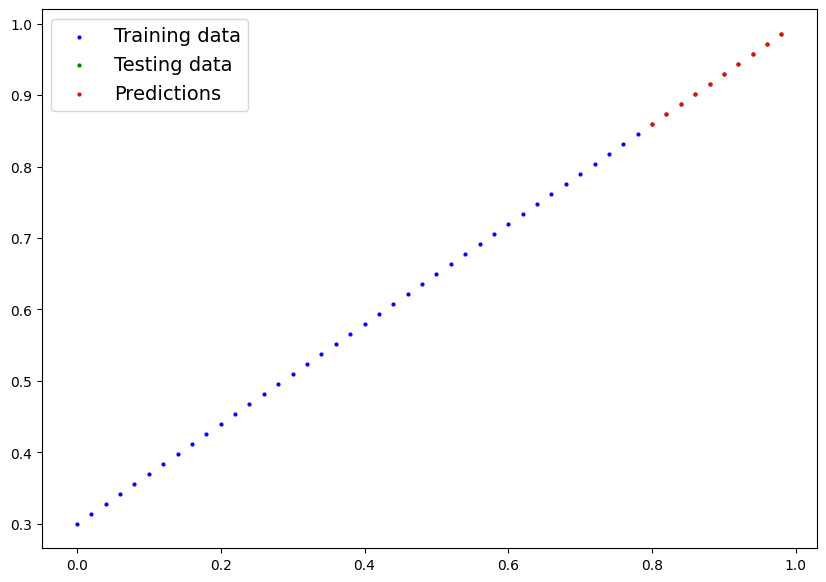

In [75]:
plot_predictions(predictions = y_preds.cpu())

### Saving and loading

In [76]:
from pathlib import Path
MODEL_PATH = Path("models")
MODEL_PATH.mkdir(parents=True, exist_ok=True)

MODEL_NAME = "01_pytorch_workflow_model_2.pth"
MODEL_SAVE_PATH = MODEL_PATH / MODEL_NAME

torch.save(obj=model_1.state_dict(), f=MODEL_SAVE_PATH)

### Load

In [77]:
loaded_model_1 = LinearRegressionModelV2()
loaded_model_1.load_state_dict(torch.load(f=MODEL_SAVE_PATH))

loaded_model_1.to(device)

LinearRegressionModelV2(
  (linear_layer): Linear(in_features=1, out_features=1, bias=True)
)

In [79]:
next(loaded_model_1.parameters()).device

device(type='cuda', index=0)

In [80]:
loaded_model_1.state_dict()

OrderedDict([('linear_layer.weight', tensor([[0.6968]], device='cuda:0')),
             ('linear_layer.bias', tensor([0.3025], device='cuda:0'))])

In [81]:
loaded_model_1.eval()

with torch.inference_mode():
  loaded_y_preds = loaded_model_1(X_test)

loaded_y_preds == y_preds

tensor([[True],
        [True],
        [True],
        [True],
        [True],
        [True],
        [True],
        [True],
        [True],
        [True]], device='cuda:0')